#INSTALL THE LIBRARY

In [1]:
#installing ibm-watson library to help call services
!pip install ibm-watson

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 400.1/400.1 kB 7.0 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.4/69.4 kB 5.2 MB/s eta 0:00:00
  Created wheel for ibm-watson: filename=ibm_watson-8.1.0-py3-none-any.whl size=402516 sha256=f57b37d13dcb002c0dd9488dcf9c9f3e5d55cf515cce57592a79c529828c0c6e
  Stored in directory: /root/.cache/pip/wheels/9c/ec/3d/75dc52e05ee4b84284f9f481ccbb85260985823c6c7083bf16
Successfully built ibm-watson


#SETUP CLOUD SERVICE AND AUTHENTICATE

In [2]:
#setup our text-to-speech module
from ibm_watson import TextToSpeechV1
from ibm_cloud_sdk_core.authenticators import IAMAuthenticator #Authenticate our Model

In [3]:
# Creds Text to Speech
apikey = 'Yfqw8JtvqTEiLO2Rc8l3ZIwtf4XV5PyIt7rbLmVlX8r3'
url = 'https://api.eu-gb.text-to-speech.watson.cloud.ibm.com/instances/1501b488-86e4-47d8-9778-23e47db0d67b'

In [4]:
#setup service
authenticator = IAMAuthenticator(apikey)
#Create our service
tts = TextToSpeechV1(authenticator=authenticator)
#set the IBM service url
tts.set_service_url(url)

#Using A Basic Language Model

In [5]:
#testing our model with a single line
#create a new audio file named speech and speak using the synthesize function
#Accept audio format as MP3

with open('./speech.mp3', 'wb') as audio_file:
    res = tts.synthesize('Hello World!', accept='audio/mp3', voice='en-US_AllisonV3Voice').get_result()
    audio_file.write(res.content) #write the content to the audio file

#Reading from our File

In [6]:
# Breve texto sobre Churchill
text = """Winston Churchill was a British statesman, writer, and orator who served as the Prime Minister of the United Kingdom during World War II and again in the 1950s.
He is remembered for his leadership during one of the most challenging times in history and for his powerful speeches that inspired millions.
Churchill won the Nobel Prize in Literature in 1953 for his historical writings and contributions to English prose."""

# Guardar el texto en el archivo
file_path = "/content/Churchill.txt"

with open(file_path, "w") as file:
    file.write(text)

print(f"Text about Churchill saved to {file_path}")


Text about Churchill saved to /content/Churchill.txt


In [7]:
#testing our model using an audio file
with open('/content/Churchill.txt', 'r') as f:
    text = f.readlines()

In [8]:
#view the contents
text

['Winston Churchill was a British statesman, writer, and orator who served as the Prime Minister of the United Kingdom during World War II and again in the 1950s.\n',
 'He is remembered for his leadership during one of the most challenging times in history and for his powerful speeches that inspired millions.\n',
 'Churchill won the Nobel Prize in Literature in 1953 for his historical writings and contributions to English prose.']

In [9]:
text = [line.replace('\n','') for line in text] #replacing the line indicator with spaces

In [10]:
text #view the converted file

['Winston Churchill was a British statesman, writer, and orator who served as the Prime Minister of the United Kingdom during World War II and again in the 1950s.',
 'He is remembered for his leadership during one of the most challenging times in history and for his powerful speeches that inspired millions.',
 'Churchill won the Nobel Prize in Literature in 1953 for his historical writings and contributions to English prose.']

In [11]:
text = ''.join(str(line) for line in text) #concatenate and feed it to the module.

In [12]:
with open('./winston.mp3', 'wb') as audio_file:
    res = tts.synthesize(text, accept='audio/mp3', voice='en-GB_JamesV3Voice').get_result() #selecting the audio format and voice
    audio_file.write(res.content) #writing the contents from text file to a audio file

In [13]:
from IPython.display import Audio, display

# Ruta del archivo MP3
audio_path = '/content/winston.mp3'

# Reproducir audio
display(Audio(audio_path, autoplay=True))


#Using a Different Language Model

In [14]:
casa = """Mi nueva casa está en una calle ancha que tiene muchos árboles.
El piso de arriba de mi casa tiene tres dormitorios y un despacho para trabajar.
El piso de abajo tiene una cocina muy grande, un comedor con una mesa y seis sillas,
un salón con dos sofás verdes, una televisión y cortinas.
Además, tiene una pequeña terraza con piscina donde puedo tomar el sol en verano.
Me gusta mucho mi casa porque puedo invitar a mis amigos a cenar o a ver el fútbol en mi televisión.
Además, cerca de mi casa hay muchas tiendas para hacer la compra, como panadería, carnicería y pescadería."""

In [15]:
with open('./casa.mp3', 'wb') as audio_file:
    res = tts.synthesize(casa, accept='audio/mp3', voice='es-US_SofiaV3Voice').get_result()
    audio_file.write(res.content)

In [16]:
from IPython.display import Audio, display

# Ruta del archivo MP3
audio_path = '/content/casa.mp3'

# Reproducir audio
display(Audio(audio_path, autoplay=True))


In [17]:
# Textos para cada planta
textos = {
    "Albahaca": "La albahaca es una planta aromática muy apreciada en la cocina por su sabor fresco y picante. Además de sus aplicaciones culinarias, tiene propiedades medicinales como ayudar a la digestión y aliviar el estrés, siendo rica en antioxidantes que protegen las células del daño.",
    "Hinojo": "El hinojo es una planta perenne utilizada tanto en la gastronomía como en la medicina tradicional. Sus propiedades digestivas ayudan a aliviar la hinchazón y malestar estomacal, mientras que su sabor anisado lo convierte en un ingrediente popular en ensaladas y salsas.",
    "Malva": "La malva es conocida por sus propiedades antiinflamatorias y antioxidantes, siendo ideal para tratar afecciones respiratorias y digestivas. Su infusión alivia la tos y la irritación de la garganta, mientras que sus hojas se usan en cosmética para calmar la piel irritada.",
    "Rúcula": "La rúcula es una planta de hojas verdes con un sabor picante que se utiliza comúnmente en ensaladas. Rica en vitamina K y antioxidantes, favorece la salud ósea y protege las células del envejecimiento. También mejora la circulación sanguínea gracias a los nitratos que contiene.",
    "Tomillo": "El tomillo es una planta aromática valorada por sus propiedades antibacterianas y antifúngicas. Usado tanto en la cocina como en la medicina, ayuda a tratar infecciones respiratorias y fortalece el sistema inmunológico, mientras que su aceite esencial es popular en aromaterapia para aliviar dolores."
}

# Generar y guardar el audio para cada planta
for planta, texto in textos.items():
    # Definir el nombre del archivo de audio
    audio_path = f"./{planta}.mp3"

    # Sintetizar el texto en audio (esto depende del motor TTS que estés usando)
    with open(audio_path, 'wb') as audio_file:
        res = tts.synthesize(texto, accept='audio/mp3', voice='es-US_SofiaV3Voice').get_result()
        audio_file.write(res.content)

    # Reproducir el archivo de audio
    display(Audio(audio_path, autoplay=True))


# **Transformers By HugginFace**

In [18]:
!pip install torch transformers datasets soundfile

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 480.6/480.6 kB 14.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 8.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.3/179.3 kB 15.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 13.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 17.4 MB/s eta 0:00:00
  Attempting uninstall: fsspec
    Found existing installation: fsspec 2024.10.0
    Uninstalling fsspec-2024.10.0:
      Successfully uninstalled fsspec-2024.10.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gcsfs 2024.10.0 requires fsspec==2024.10.0, but you have fsspec 2024.9.0 which is incompatible.


In [19]:
from transformers import pipeline

# Instancia el pipeline de Text-to-Speech
tts_pipeline = pipeline("text-to-speech", model="suno/bark")

# Define el texto que quieres convertir a audio
texto = "Hello! This is a test of text-to-speech using the Bark model from Hugging Face."

# Genera el audio
audio_output = tts_pipeline(texto)

# Guarda el audio generado en un archivo .wav
output_path = "output_audio.wav"
with open(output_path, "wb") as audio_file:
    audio_file.write(audio_output["audio"])

print(f"Audio generado y guardado en {output_path}")


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/8.81k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/4.49G [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/models/encodec/modeling_encodec.py:124: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.register_buffer("padding_total", torch.tensor(kernel_size - stride, dtype=torch.int64), persistent=False)


generation_config.json:   0%|          | 0.00/4.91k [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/353 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/996k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.92M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

Hardware accelerator e.g. GPU is available in the environment, but no `device` argument is passed to the `Pipeline` object. Model will be on CPU.
The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.
The attention mask is not set and cannot be inferred from input because pad token is same as eos token. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.


Audio generado y guardado en output_audio.wav


In [20]:
from IPython.display import Audio

# Reproducir el archivo de audio
Audio("output_audio.wav")


In [ ]:
# Textos para cada planta en español
textos = {
    "Albahaca": "La albahaca es una planta aromática muy apreciada en la cocina por su sabor fresco y picante. Además de sus aplicaciones culinarias, tiene propiedades medicinales como ayudar a la digestión y aliviar el estrés, siendo rica en antioxidantes que protegen las células del daño.",
    "Hinojo": "El hinojo es una planta perenne utilizada tanto en la gastronomía como en la medicina tradicional. Sus propiedades digestivas ayudan a aliviar la hinchazón y malestar estomacal, mientras que su sabor anisado lo convierte en un ingrediente popular en ensaladas y salsas.",
    "Malva": "La malva es conocida por sus propiedades antiinflamatorias y antioxidantes, siendo ideal para tratar afecciones respiratorias y digestivas. Su infusión alivia la tos y la irritación de la garganta, mientras que sus hojas se usan en cosmética para calmar la piel irritada.",
    "Rúcula": "La rúcula es una planta de hojas verdes con un sabor picante que se utiliza comúnmente en ensaladas. Rica en vitamina K y antioxidantes, favorece la salud ósea y protege las células del envejecimiento. También mejora la circulación sanguínea gracias a los nitratos que contiene.",
    "Tomillo": "El tomillo es una planta aromática valorada por sus propiedades antibacterianas y antifúngicas. Usado tanto en la cocina como en la medicina, ayuda a tratar infecciones respiratorias y fortalece el sistema inmunológico, mientras que su aceite esencial es popular en aromaterapia para aliviar dolores."
}

# Generar y guardar el audio para cada planta
for planta, texto in textos.items():
    # Genera el audio para el texto (en español)
    audio_output = tts_pipeline(texto)

    # Define el nombre del archivo de audio
    output_path = f"./{planta}.wav"

    # Guarda el audio generado en un archivo .wav
    with open(output_path, "wb") as audio_file:
        audio_file.write(audio_output["audio"])

    print(f"Audio para {planta} generado y guardado en {output_path}")

    # Reproducir el archivo de audio
    from IPython.display import Audio
    display(Audio(output_path, autoplay=True))

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


Audio para Albahaca generado y guardado en ./Albahaca.wav


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


Audio para Hinojo generado y guardado en ./Hinojo.wav


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


Audio para Malva generado y guardado en ./Malva.wav


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


Audio para Rúcula generado y guardado en ./Rúcula.wav


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:None for open-end generation.


# **Medium**

In [ ]:
!pip3 install deep_phonemizer

In [ ]:
import IPython
import matplotlib
import matplotlib.pyplot as plt

In [ ]:
import torch
import torchaudio

matplotlib.rcParams["figure.figsize"] = [16.0, 4.8]

torch.random.manual_seed(0)
device = "cuda" if torch.cuda.is_available() else "cpu"

print(torch.__version__)
print(torchaudio.__version__)
print(device)

2.5.1+cu121
2.5.1+cu121
cuda


In [ ]:
symbols = "_-!'(),.:;? abcdefghijklmnopqrstuvwxyz"
look_up = {s: i for i, s in enumerate(symbols)}
symbols = set(symbols)


def text_to_sequence(text):
    text = text.lower()
    return [look_up[s] for s in text if s in symbols]


text = "Hello world! Text to speech!"
print(text_to_sequence(text))

[19, 16, 23, 23, 26, 11, 34, 26, 29, 23, 15, 2, 11, 31, 16, 35, 31, 11, 31, 26, 11, 30, 27, 16, 16, 14, 19, 2]


In [ ]:
processor = torchaudio.pipelines.TACOTRON2_WAVERNN_CHAR_LJSPEECH.get_text_processor()

text = "Hello world! Text to speech!"
processed, lengths = processor(text)

print(processed)
print(lengths)

tensor([[19, 16, 23, 23, 26, 11, 34, 26, 29, 23, 15,  2, 11, 31, 16, 35, 31, 11,
         31, 26, 11, 30, 27, 16, 16, 14, 19,  2]])
tensor([28], dtype=torch.int32)


In [ ]:
print([processor.tokens[i] for i in processed[0, : lengths[0]]])

['h', 'e', 'l', 'l', 'o', ' ', 'w', 'o', 'r', 'l', 'd', '!', ' ', 't', 'e', 'x', 't', ' ', 't', 'o', ' ', 's', 'p', 'e', 'e', 'c', 'h', '!']


In [ ]:
bundle = torchaudio.pipelines.TACOTRON2_WAVERNN_PHONE_LJSPEECH

processor = bundle.get_text_processor()

text = "Hello world! Text to speech!"
with torch.inference_mode():
    processed, lengths = processor(text)

print(processed)
print(lengths)

tensor([[54, 20, 65, 69, 11, 92, 44, 65, 38,  2, 11, 81, 40, 64, 79, 81, 11, 81,
         20, 11, 79, 77, 59, 37,  2]])
tensor([25], dtype=torch.int32)


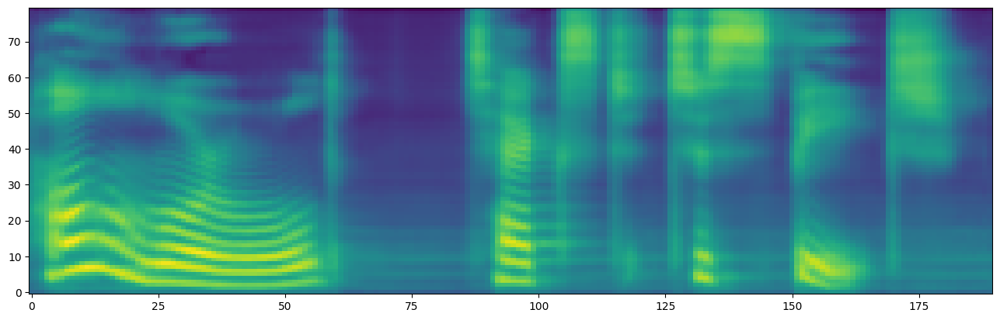

In [ ]:
bundle = torchaudio.pipelines.TACOTRON2_WAVERNN_PHONE_LJSPEECH
processor = bundle.get_text_processor()
tacotron2 = bundle.get_tacotron2().to(device)

text = "Hello world! Text to speech!"

with torch.inference_mode():
    processed, lengths = processor(text)
    processed = processed.to(device)
    lengths = lengths.to(device)
    spec, _, _ = tacotron2.infer(processed, lengths)


_ = plt.imshow(spec[0].cpu().detach(), origin="lower", aspect="auto")

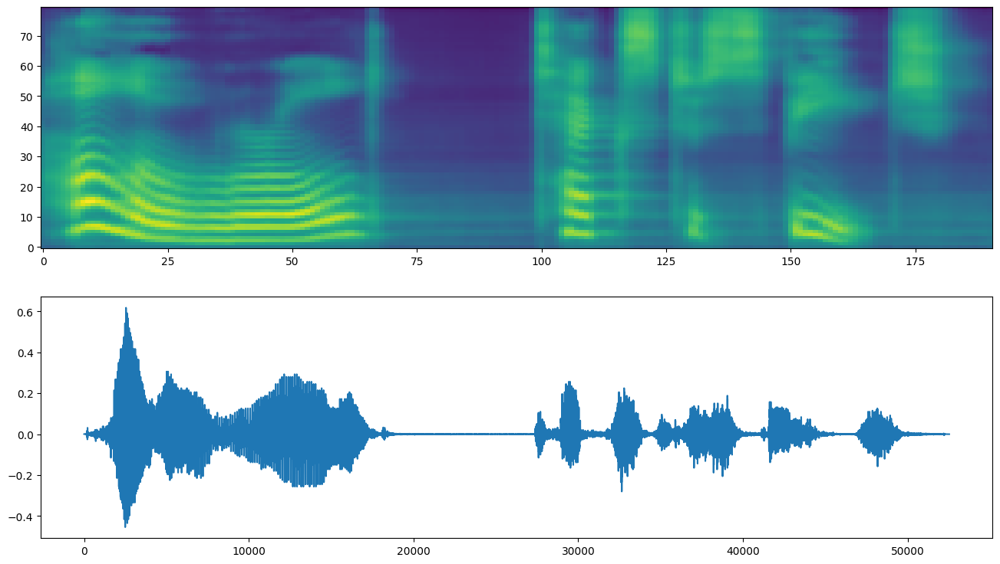

In [ ]:
bundle = torchaudio.pipelines.TACOTRON2_WAVERNN_PHONE_LJSPEECH

processor = bundle.get_text_processor()
tacotron2 = bundle.get_tacotron2().to(device)
vocoder = bundle.get_vocoder().to(device)

text = "Hello world! Text to speech!"

with torch.inference_mode():
    processed, lengths = processor(text)
    processed = processed.to(device)
    lengths = lengths.to(device)
    spec, spec_lengths, _ = tacotron2.infer(processed, lengths)
    waveforms, lengths = vocoder(spec, spec_lengths)

fig, [ax1, ax2] = plt.subplots(2, 1, figsize=(16, 9))
ax1.imshow(spec[0].cpu().detach(), origin="lower", aspect="auto")
ax2.plot(waveforms[0].cpu().detach())

IPython.display.Audio(waveforms[0:1].cpu(), rate=vocoder.sample_rate)

# **ChatGpt intenta un fine tunning**

In [ ]:
!pip install torch torchaudio transformers datasets


In [ ]:
{
  "train": [
    {"text": "El avance de la inteligencia artificial ha permitido resolver problemas complejos que antes eran impensables. Desde la predicción del clima hasta la traducción automática, los modelos actuales muestran un nivel sorprendente de precisión.", "audio": "train/audio_1.wav"},
    {"text": "La calidad de los datos es un factor clave en el desarrollo de cualquier sistema de aprendizaje automático. Si los datos están incompletos o contienen errores, los resultados pueden ser poco fiables o incluso llevar a conclusiones equivocadas.", "audio": "train/audio_2.wav"}
  ],
  "validation": [
    {"text": "En el mundo de la tecnología, la colaboración entre desarrolladores, científicos de datos y expertos en el dominio es esencial. Juntos, pueden diseñar soluciones innovadoras que aborden problemas reales de manera eficiente.", "audio": "validation/audio_3.wav"},
    {"text": "El procesamiento del lenguaje natural es una de las ramas más fascinantes de la inteligencia artificial. Permite a las máquinas entender, interpretar y generar lenguaje humano, abriendo posibilidades como asistentes virtuales, análisis de sentimientos y traducción de textos en tiempo real.", "audio": "validation/audio_4.wav"}
  ]
}


{'train': [{'text': 'El avance de la inteligencia artificial ha permitido resolver problemas complejos que antes eran impensables. Desde la predicción del clima hasta la traducción automática, los modelos actuales muestran un nivel sorprendente de precisión.',
   'audio': 'train/audio_1.wav'},
  {'text': 'La calidad de los datos es un factor clave en el desarrollo de cualquier sistema de aprendizaje automático. Si los datos están incompletos o contienen errores, los resultados pueden ser poco fiables o incluso llevar a conclusiones equivocadas.',
   'audio': 'train/audio_2.wav'}],
 'validation': [{'text': 'En el mundo de la tecnología, la colaboración entre desarrolladores, científicos de datos y expertos en el dominio es esencial. Juntos, pueden diseñar soluciones innovadoras que aborden problemas reales de manera eficiente.',
   'audio': 'validation/audio_3.wav'},
  {'text': 'El procesamiento del lenguaje natural es una de las ramas más fascinantes de la inteligencia artificial. Perm

In [ ]:
import os
from datasets import Dataset, DatasetDict, Audio

def load_dataset(data_dir):
    # Listar archivos de texto y audio
    train_texts = sorted([f for f in os.listdir(f"{data_dir}/train") if f.endswith(".txt")])
    train_audios = sorted([f for f in os.listdir(f"{data_dir}/train") if f.endswith(".wav")])

    validation_texts = sorted([f for f in os.listdir(f"{data_dir}/validation") if f.endswith(".txt")])
    validation_audios = sorted([f for f in os.listdir(f"{data_dir}/validation") if f.endswith(".wav")])

    # Crear listas para train y validation
    train_data = [
        {"text": open(f"{data_dir}/train/{text_file}", encoding="utf-8").read(),
         "audio": f"{data_dir}/train/{audio_file}"}
        for text_file, audio_file in zip(train_texts, train_audios)
    ]
    validation_data = [
        {"text": open(f"{data_dir}/validation/{text_file}", encoding="utf-8").read(),
         "audio": f"{data_dir}/validation/{audio_file}"}
        for text_file, audio_file in zip(validation_texts, validation_audios)
    ]

    return DatasetDict({
        "train": Dataset.from_list(train_data).cast_column("audio", Audio()),
        "validation": Dataset.from_list(validation_data).cast_column("audio", Audio())
    })

dataset = load_dataset("/content/drive/MyDrive/textToSpeech/dataset/")

In [ ]:
from transformers import SpeechT5Processor, SpeechT5ForTextToSpeech

# Cargar procesador y modelo preentrenado
processor = SpeechT5Processor.from_pretrained("microsoft/speecht5_tts")
model = SpeechT5ForTextToSpeech.from_pretrained("microsoft/speecht5_tts")


In [ ]:
import librosa

def resample_audio(audio):
    audio_array = audio["array"]
    original_rate = audio["sampling_rate"]
    target_rate = 16000  # Frecuencia esperada por el modelo
    resampled_audio = librosa.resample(audio_array, orig_sr=original_rate, target_sr=target_rate)
    return {"array": resampled_audio, "sampling_rate": target_rate}


In [ ]:
def preprocess_function(examples):
    # Leer audio y texto
    audio = examples["audio"]
    text = examples["text"]

    # Tokenización del texto con truncamiento
    input_ids = processor.tokenizer(
        text,
        return_tensors="pt",
        padding="max_length",
        truncation=True,
        max_length=600
    ).input_ids

    # Procesar y remuestrear el audio si es necesario
    audio_array = processor.feature_extractor(
        audio["array"],
        sampling_rate=audio["sampling_rate"]
    )

    return {"input_ids": input_ids, "audio": audio_array}


In [ ]:
processed_dataset = dataset.map(preprocess_function, remove_columns=["text", "audio"])


Map:   0%|          | 0/2 [00:00<?, ? examples/s]

ValueError: The model corresponding to this feature extractor: SpeechT5FeatureExtractor {
  "do_normalize": false,
  "feature_extractor_type": "SpeechT5FeatureExtractor",
  "feature_size": 1,
  "fmax": 7600,
  "fmin": 80,
  "frame_signal_scale": 1.0,
  "hop_length": 16,
  "mel_floor": 1e-10,
  "num_mel_bins": 80,
  "padding_side": "right",
  "padding_value": 0.0,
  "processor_class": "SpeechT5Processor",
  "reduction_factor": 2,
  "return_attention_mask": true,
  "sampling_rate": 16000,
  "win_function": "hann_window",
  "win_length": 64
}
 was trained using a sampling rate of 16000. Please make sure that the provided audio input was sampled with 16000 and not 48000.

# **Otro tutorial**

In [ ]:
!git clone https://github.com/coqui-ai/TTS


Cloning into 'TTS'...
remote: Enumerating objects: 32844, done.
remote: Counting objects: 100% (3521/3521), done.
remote: Compressing objects: 100% (126/126), done.
remote: Total 32844 (delta 3433), reused 3395 (delta 3395), pack-reused 29323 (from 1)
Receiving objects: 100% (32844/32844), 166.12 MiB | 31.65 MiB/s, done.
Resolving deltas: 100% (23858/23858), done.


In [ ]:
#move to TTS
%cd /content/TTS


/content/TTS


In [ ]:
!pip install -e .

Obtaining file:///content/TTS
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.5/73.5 kB 4.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.7/3.7 MB 66.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.6/101.6 kB 8.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.3/15.3 MB 77.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.1/18.1 MB 22.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 31.4/31.4 MB 13.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) 

In [ ]:
!pip install pyttsx3

  Using cached pyttsx3-2.98-py3-none-any.whl.metadata (3.8 kB)
Using cached pyttsx3-2.98-py3-none-any.whl (34 kB)


In [ ]:
!sudo apt update
!sudo apt install espeak espeak-ng

Get:1 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,626 B]
Get:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease [1,581 B]
Hit:3 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:4 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Get:5 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Get:6 https://r2u.stat.illinois.edu/ubuntu jammy InRelease [6,555 B]
Get:7 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  Packages [1,172 kB]
Get:8 http://archive.ubuntu.com/ubuntu jammy-backports InRelease [127 kB]
Hit:9 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:10 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Get:11 https://r2u.stat.illinois.edu/ubuntu jammy/main amd64 Packages [2,618 kB]
Get:12 http://archive.ubuntu.com/ubuntu jammy-updates/main amd64 Packages [2,734 kB]
Hit:13 https://ppa.launchpadcontent.net/

In [ ]:
import pyttsx3

# Inicializar el motor de TTS
engine = pyttsx3.init()

# Configurar el idioma a español (si está disponible)
voices = engine.getProperty('voices')
for voice in voices:
    if "spanish" in voice.name.lower():
        engine.setProperty('voice', voice.id)
        break

# Configurar velocidad y volumen
engine.setProperty('rate', 150)  # Velocidad (palabras por minuto)
engine.setProperty('volume', 1.0)  # Volumen (0.0 a 1.0)

# Texto a sintetizar
texto = "Bienvenido al sistema"

# Generar y reproducir el audio
engine.say(texto)
engine.runAndWait()
#save audio
engine.save_to_file(texto, 'welcome.mp3')


In [ ]:
import IPython.display as ipd

ipd.Audio("welcome.mp3")

In [ ]:
!pip install TTS

  Using cached numpy-1.22.0-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (2.0 kB)
Using cached numpy-1.22.0-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (16.8 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 1.26.4
    Uninstalling numpy-1.26.4:
      Successfully uninstalled numpy-1.26.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
albucore 0.0.19 requires numpy>=1.24.4, but you have numpy 1.22.0 which is incompatible.
albumentations 1.4.20 requires numpy>=1.24.4, but you have numpy 1.22.0 which is incompatible.
arviz 0.20.0 requires numpy>=1.23.0, but you have numpy 1.22.0 which is incompatible.
astropy 6.1.6 requires numpy>=1.23, but you have numpy 1.22.0 which is incompatible.
bigframes 1.27.0 requires numpy>=1.24.0, but you have numpy 1.22.0 which is incompatible.
chex 0.1.87 requires numpy>=1

In [ ]:
!pip install soundfile

In [ ]:
!pip install numpy==1.23 --upgrade

In [ ]:
from TTS.api import TTS

# Cargar un modelo preentrenado en español
tts = TTS(model_name="tts_models/es/mai/tacotron2-DDC")

# Texto en español para sintetizar
texto = "Este es un ejemplo simple de texto a voz usando Coqui TTS en español."

# Generar y guardar el archivo de audio
tts.tts_to_file(text=texto, file_path="salida.wav")

print("La síntesis de voz en español se completó. El archivo 'salida.wav' está listo.")


 > Downloading model to /root/.local/share/tts/tts_models--es--mai--tacotron2-DDC


100%|█████████▉| 574M/575M [00:14<00:00, 42.6MiB/s]

 > Model's license - MPL
 > Check https://www.mozilla.org/en-US/MPL/2.0/ for more info.
 > Downloading model to /root/.local/share/tts/vocoder_models--universal--libri-tts--fullband-melgan



100%|██████████| 575M/575M [00:21<00:00, 26.6MiB/s]

  3%|▎         | 2.80M/109M [00:00<00:03, 28.0MiB/s]
  7%|▋         | 7.31M/109M [00:00<00:02, 37.9MiB/s]
 10%|█         | 11.1M/109M [00:00<00:02, 34.2MiB/s]
 13%|█▎        | 14.5M/109M [00:00<00:03, 30.6MiB/s]
 16%|█▌        | 17.7M/109M [00:00<00:03, 29.8MiB/s]
 19%|█▉        | 20.7M/109M [00:00<00:03, 26.1MiB/s]
 22%|██▏       | 23.5M/109M [00:00<00:03, 26.7MiB/s]
 24%|██▍       | 26.3M/109M [00:00<00:03, 26.9MiB/s]
 27%|██▋       | 29.1M/109M [00:01<00:02, 27.3MiB/s]
 29%|██▉       | 31.9M/109M [00:01<00:02, 26.2MiB/s]
 32%|███▏      | 34.5M/109M [00:01<00:02, 26.2MiB/s]
 34%|███▍      | 37.3M/109M [00:01<00:02, 26.6MiB/s]
 37%|███▋      | 40.0M/109M [00:01<00:02, 26.6MiB/s]
 39%|███▉      | 42.6M/109M [00:01<00:02, 26.0MiB/s]
 42%|████▏     | 45.2M/109M [00:01<00:02, 25.9MiB/s]
 44%|████▍     | 47.8M/109M [00:01<00:02, 23.8MiB/s]
 46%|████▌     | 50.3M/109M [00:01<00:02, 23.9MiB/s]
 51%|█████     | 55.1M/109M [00:01<00:01, 31.

 > Model's license - MPL
 > Check https://www.mozilla.org/en-US/MPL/2.0/ for more info.
 > Using model: Tacotron2
 > Setting up Audio Processor...
 | > sample_rate:16000
 | > resample:False
 | > num_mels:80
 | > log_func:np.log10
 | > min_level_db:-100
 | > frame_shift_ms:None
 | > frame_length_ms:None
 | > ref_level_db:20
 | > fft_size:1024
 | > power:1.5
 | > preemphasis:0.0
 | > griffin_lim_iters:60
 | > signal_norm:True
 | > symmetric_norm:True
 | > mel_fmin:50.0
 | > mel_fmax:7600.0
 | > pitch_fmin:0.0
 | > pitch_fmax:640.0
 | > spec_gain:1.0
 | > stft_pad_mode:reflect
 | > max_norm:4.0
 | > clip_norm:True
 | > do_trim_silence:True
 | > trim_db:60
 | > do_sound_norm:False
 | > do_amp_to_db_linear:True
 | > do_amp_to_db_mel:True
 | > do_rms_norm:False
 | > db_level:None
 | > stats_path:/root/.local/share/tts/tts_models--es--mai--tacotron2-DDC/scale_stats.npy
 | > base:10
 | > hop_length:256
 | > win_length:1024


/content/TTS/TTS/utils/io.py:54: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(f, map_location=map_location, **kwargs)


 > Model's reduction rate `r` is set to: 1
 > Vocoder Model: fullband_melgan
 > Setting up Audio Processor...
 | > sample_rate:24000
 | > resample:False
 | > num_mels:80
 | > log_func:np.log10
 | > min_level_db:-100
 | > frame_shift_ms:None
 | > frame_length_ms:None
 | > ref_level_db:0
 | > fft_size:1024
 | > power:1.5
 | > preemphasis:0.0
 | > griffin_lim_iters:60
 | > signal_norm:True
 | > symmetric_norm:True
 | > mel_fmin:50.0
 | > mel_fmax:7600.0
 | > pitch_fmin:0.0
 | > pitch_fmax:640.0
 | > spec_gain:1.0
 | > stft_pad_mode:reflect
 | > max_norm:4.0
 | > clip_norm:True
 | > do_trim_silence:True
 | > trim_db:60
 | > do_sound_norm:False
 | > do_amp_to_db_linear:True
 | > do_amp_to_db_mel:True
 | > do_rms_norm:False
 | > db_level:None
 | > stats_path:/root/.local/share/tts/vocoder_models--universal--libri-tts--fullband-melgan/scale_stats.npy
 | > base:10
 | > hop_length:256
 | > win_length:1024
 > Generator Model: fullband_melgan_generator
 > Discriminator Model: melgan_multiscale_di

In [ ]:
import IPython.display as ipd

ipd.Audio("/content/salida.wav")

In [ ]:
%cd ..

/content


In [ ]:
!git clone https://github.com/coqui-ai/TTS
%cd TTS
!pip install -e .

Cloning into 'TTS'...
remote: Enumerating objects: 32844, done.
remote: Counting objects: 100% (3521/3521), done.
remote: Compressing objects: 100% (126/126), done.
remote: Total 32844 (delta 3433), reused 3395 (delta 3395), pack-reused 29323 (from 1)
Receiving objects: 100% (32844/32844), 166.12 MiB | 15.49 MiB/s, done.
Resolving deltas: 100% (23858/23858), done.
/content/TTS
Obtaining file:///content/TTS
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.5/73.5 kB 6.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.7/3.7 MB 98.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.6/101.6 kB 9.6 MB/s eta 0:00:00
  Preparing metada

In [ ]:
!pip install numpy==1.23 --upgrade

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.0/17.0 MB 97.1 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 1.22.0
    Uninstalling numpy-1.22.0:
      Successfully uninstalled numpy-1.22.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tts 0.22.0 requires numpy==1.22.0; python_version <= "3.10", but you have numpy 1.23.0 which is incompatible.
albucore 0.0.19 requires numpy>=1.24.4, but you have numpy 1.23.0 which is incompatible.
albumentations 1.4.20 requires numpy>=1.24.4, but you have numpy 1.23.0 which is incompatible.
bigframes 1.27.0 requires numpy>=1.24.0, but you have numpy 1.23.0 which is incompatible.
chex 0.1.87 requires numpy>=1.24.1, but you have numpy 1.23.0 which is incompatible.
cudf-cu12 24.10.1 requires pandas<2.2.3dev0,>=2.0, but you have pandas 1.5.3 which is incompatible.
ibis-framework 9.2.0 requi

In [ ]:
!tts --list_models  # list the available models.


 Name format: type/language/dataset/model
 1: tts_models/multilingual/multi-dataset/xtts_v2
 2: tts_models/multilingual/multi-dataset/xtts_v1.1
 3: tts_models/multilingual/multi-dataset/your_tts
 4: tts_models/multilingual/multi-dataset/bark
 5: tts_models/bg/cv/vits
 6: tts_models/cs/cv/vits
 7: tts_models/da/cv/vits
 8: tts_models/et/cv/vits
 9: tts_models/ga/cv/vits
 10: tts_models/en/ek1/tacotron2
 11: tts_models/en/ljspeech/tacotron2-DDC
 12: tts_models/en/ljspeech/tacotron2-DDC_ph
 13: tts_models/en/ljspeech/glow-tts
 14: tts_models/en/ljspeech/speedy-speech
 15: tts_models/en/ljspeech/tacotron2-DCA
 16: tts_models/en/ljspeech/vits
 17: tts_models/en/ljspeech/vits--neon
 18: tts_models/en/ljspeech/fast_pitch
 19: tts_models/en/ljspeech/overflow
 20: tts_models/en/ljspeech/neural_hmm
 21: tts_models/en/vctk/vits
 22: tts_models/en/vctk/fast_pitch
 23: tts_models/en/sam/tacotron-DDC
 24: tts_models/en/blizzard2013/capacitron-t2-c50
 25: tts_models/en/blizzard2013/capacitron-t2-c15

In [ ]:
from TTS.api import TTS

# Cargar un modelo preentrenado en español
tts = TTS(model_name="tts_models/es/css10/vits")

# Texto en español para sintetizar
texto = "Este es un ejemplo simple de texto a voz usando Coqui TTS en español."

# Generar y guardar el archivo de audio
tts.tts_to_file(text=texto, file_path="salida.wav")

print("La síntesis de voz en español se completó. El archivo 'salida.wav' está listo.")


 > Downloading model to /root/.local/share/tts/tts_models--es--css10--vits


 93%|█████████▎| 94.2M/101M [00:01<00:00, 54.3MiB/s]

 > Model's license - bsd-3-clause
 > Check https://opensource.org/licenses for more info.
 > Using model: vits
 > Setting up Audio Processor...
 | > sample_rate:22050
 | > resample:False
 | > num_mels:80
 | > log_func:np.log10
 | > min_level_db:0
 | > frame_shift_ms:None
 | > frame_length_ms:None
 | > ref_level_db:None
 | > fft_size:1024
 | > power:None
 | > preemphasis:0.0
 | > griffin_lim_iters:None
 | > signal_norm:None
 | > symmetric_norm:None
 | > mel_fmin:0
 | > mel_fmax:None
 | > pitch_fmin:None
 | > pitch_fmax:None
 | > spec_gain:20.0
 | > stft_pad_mode:reflect
 | > max_norm:1.0
 | > clip_norm:True
 | > do_trim_silence:False
 | > trim_db:60
 | > do_sound_norm:False
 | > do_amp_to_db_linear:True
 | > do_amp_to_db_mel:True
 | > do_rms_norm:False
 | > db_level:None
 | > stats_path:None
 | > base:10
 | > hop_length:256
 | > win_length:1024
 > initialization of speaker-embedding layers.
 > initialization of language-embedding layers.


/content/TTS/TTS/utils/io.py:54: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(f, map_location=map_location, **kwargs)


 > Text splitted to sentences.
['Este es un ejemplo simple de texto a voz usando Coqui TTS en español.']
 > Processing time: 4.36482310295105
 > Real-time factor: 0.9168224110279554
La síntesis de voz en español se completó. El archivo 'salida.wav' está listo.


In [ ]:
import IPython.display as ipd

ipd.Audio("/content/salida.wav")

In [ ]:
#cargar drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import torch
from TTS.api import TTS

# Get device
device = "cuda" if torch.cuda.is_available() else "cpu"

# List available 🐸TTS models
print(TTS().list_models())

# Init TTS
tts = TTS("tts_models/multilingual/multi-dataset/xtts_v2").to(device)

# Run TTS
# ❗ Since this model is multi-lingual voice cloning model, we must set the target speaker_wav and language
# Text to speech list of amplitude values as output
wav = tts.tts(text="este audio se hace para probar la sintetizacion de mi propia voz con inteligencia artificial y un modelo en una bibliteca llamada tts para sintetizacion o clonacion de la voz en español", speaker_wav="/content/drive/MyDrive/clonacion_de_voz/Manuel_voz_clonacion.wav", language="es")
# Text to speech to a file
tts.tts_to_file(text="Hola. Soy la voz clonada de Manuel, la persona original.", speaker_wav="/content/drive/MyDrive/clonacion_de_voz/Manuel_voz_clonacion.wav", language="es", file_path="clon_tts.wav")

 > tts_models/multilingual/multi-dataset/xtts_v2 is already downloaded.
 > Using model: xtts
 > Text splitted to sentences.
['este audio se hace para probar la sintetizacion de mi propia voz con inteligencia artificial y un modelo en una bibliteca llamada tts para sintetizacion o clonacion de la voz en español']
 > Processing time: 7.5464560985565186
 > Real-time factor: 0.4946473156158479
 > Text splitted to sentences.
['Hola.', 'Soy la voz clonada de Manuel, la persona original.']
 > Processing time: 4.888782024383545
 > Real-time factor: 0.6588453674314074


'clon_tts.wav'

In [ ]:
import IPython.display as ipd

ipd.Audio("/content/clon_tts.wav")

In [ ]:

import torch
from TTS.api import TTS

# Get device
device = "cuda" if torch.cuda.is_available() else "cpu"

# List available 🐸TTS models
print(TTS().list_models())

# Init TTS
tts = TTS("tts_models/multilingual/multi-dataset/xtts_v1.1").to(device)

wav = tts.tts(text="siento que es importante hacer una profunda evaluación económica, política, social, cultural y ambiental a sesen, sesenta años de vida que tiene las naciones unidas. Que ha obtenido las naciones unidas. En algunos países que ha estado con las oligarquías, acompañado por las transnacionales, internaciones y por tanto, siento que ha setenta años, de la fundación de las naciones unidas, no se ha cumplido con las metas que era la paz y la estabilidad en el mundo", speaker_wav="/content/drive/MyDrive/clonacion_de_voz/evoVideo.wav", language="es")
# Text to speech to a file
tts.tts_to_file(text="CompañerosCompañeras Se ha ido a la mierda el semestre", speaker_wav="/content/drive/MyDrive/clonacion_de_voz/evoVideo.wav", language="es", file_path="clon_evo_xtts1.wav")

 > tts_models/multilingual/multi-dataset/xtts_v1.1 is already downloaded.
 > Using model: xtts
 > Text splitted to sentences.
['siento que es importante hacer una profunda evaluación económica, política, social, cultural y ambiental a sesen, sesenta años de vida que tiene las naciones unidas.', 'Que ha obtenido las naciones unidas.', 'En algunos países que ha estado con las oligarquías, acompañado por las transnacionales, internaciones y por tanto, siento que ha setenta años, de la fundación de las naciones unidas, no se ha cumplido con las metas que era la paz y la estabilidad en el mundo']
[!] Warning: The text length exceeds the character limit of 239 for language 'es', this might cause truncated audio.
 > Processing time: 23.609585762023926
 > Real-time factor: 0.5244935984249088
 > Text splitted to sentences.
['CompañerosCompañeras Se ha ido a la mierda el semestre']
 > Processing time: 2.6603193283081055
 > Real-time factor: 0.4833556459228224


'clon_evo_xtts1.wav'

In [ ]:
import IPython.display as ipd

ipd.Audio("/content/clon_evo_xtts1.wav")

In [ ]:

import torch
from TTS.api import TTS

# Get device
device = "cuda" if torch.cuda.is_available() else "cpu"

# List available 🐸TTS models
print(TTS().list_models())

# Init TTS
tts = TTS("tts_models/multilingual/multi-dataset/xtts_v2").to(device)

wav = tts.tts(text="siento que es importante hacer una profunda evaluación económica, política, social, cultural y ambiental a sesen, sesenta años de vida que tiene las naciones unidas. Que ha obtenido las naciones unidas. En algunos países que ha estado con las oligarquías, acompañado por las transnacionales, internaciones y por tanto, siento que ha setenta años, de la fundación de las naciones unidas, no se ha cumplido con las metas que era la paz y la estabilidad en el mundo", speaker_wav="/content/drive/MyDrive/clonacion_de_voz/evoVideo.wav", language="es")
# Text to speech to a file
tts.tts_to_file(text="Compañeros, Compañeras. Se ha ido a la mierda el semestre.", speaker_wav="/content/drive/MyDrive/clonacion_de_voz/evoVideo.wav", language="es", file_path="clon_evo_xtts2.wav")

 > tts_models/multilingual/multi-dataset/xtts_v2 is already downloaded.
 > Using model: xtts
 > Text splitted to sentences.
['siento que es importante hacer una profunda evaluación económica, política, social, cultural y ambiental a sesen, sesenta años de vida que tiene las naciones unidas.', 'Que ha obtenido las naciones unidas.', 'En algunos países que ha estado con las oligarquías, acompañado por las transnacionales, internaciones y por tanto, siento que ha setenta años, de la fundación de las naciones unidas, no se ha cumplido con las metas que era la paz y la estabilidad en el mundo']


The attention mask is not set and cannot be inferred from input because pad token is same as eos token. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.


[!] Warning: The text length exceeds the character limit of 239 for language 'es', this might cause truncated audio.
 > Processing time: 24.625961303710938
 > Real-time factor: 0.5321132805731766
 > Text splitted to sentences.
['Compañeros, Compañeras.', 'Se ha ido a la mierda el semestre.']
 > Processing time: 3.6228508949279785
 > Real-time factor: 0.4574621027645795


'clon_evo_xtts2.wav'

In [ ]:
import IPython.display as ipd

ipd.Audio("/content/clon_evo_xtts2.wav")

In [ ]:

import torch
from TTS.api import TTS

# Get device
device = "cuda" if torch.cuda.is_available() else "cpu"

# List available 🐸TTS models
print(TTS().list_models())

# Init TTS
tts = TTS("tts_models/es/css10/vits").to(device)

wav = tts.tts(text="siento que es importante hacer una profunda evaluación económica, política, social, cultural y ambiental a sesen, sesenta años de vida que tiene las naciones unidas. Que ha obtenido las naciones unidas. En algunos países que ha estado con las oligarquías, acompañado por las transnacionales, internaciones y por tanto, siento que ha setenta años, de la fundación de las naciones unidas, no se ha cumplido con las metas que era la paz y la estabilidad en el mundo", speaker_wav="/content/drive/MyDrive/clonacion_de_voz/evoVideo.wav")
# Text to speech to a file
tts.tts_to_file(text="Compañeros, Compañeras. Se ha ido a la mierda el semestre.", speaker_wav="/content/drive/MyDrive/clonacion_de_voz/evoVideo.wav", file_path="clon_evo_vits.wav")

 > tts_models/es/css10/vits is already downloaded.
 > Using model: vits
 > Setting up Audio Processor...
 | > sample_rate:22050
 | > resample:False
 | > num_mels:80
 | > log_func:np.log10
 | > min_level_db:0
 | > frame_shift_ms:None
 | > frame_length_ms:None
 | > ref_level_db:None
 | > fft_size:1024
 | > power:None
 | > preemphasis:0.0
 | > griffin_lim_iters:None
 | > signal_norm:None
 | > symmetric_norm:None
 | > mel_fmin:0
 | > mel_fmax:None
 | > pitch_fmin:None
 | > pitch_fmax:None
 | > spec_gain:20.0
 | > stft_pad_mode:reflect
 | > max_norm:1.0
 | > clip_norm:True
 | > do_trim_silence:False
 | > trim_db:60
 | > do_sound_norm:False
 | > do_amp_to_db_linear:True
 | > do_amp_to_db_mel:True
 | > do_rms_norm:False
 | > db_level:None
 | > stats_path:None
 | > base:10
 | > hop_length:256
 | > win_length:1024
 > initialization of speaker-embedding layers.
 > initialization of language-embedding layers.
 > Text splitted to sentences.
['siento que es importante hacer una profunda evaluación 

'clon_evo_vits.wav'

In [ ]:
import IPython.display as ipd

ipd.Audio("/content/clon_evo_vits.wav")

In [ ]:
wav = tts.tts(text="este audio se hace para probar la sintetizacion de mi propia voz con inteligencia artificial y un modelo en una bibliteca llamada tts para sintetizacion o clonacion de la voz en español", speaker_wav="/content/drive/MyDrive/clonacion_de_voz/Manuel_voz_clonacion.wav", language="es")
# Text to speech to a file
tts.tts_to_file(text="En mi opinion se pueden ir a su casa", speaker_wav="/content/drive/MyDrive/clonacion_de_voz/Manuel_voz_clonacion.wav", language="es", file_path="clon.wav")

 > Text splitted to sentences.
['este audio se hace para probar la sintetizacion de mi propia voz con inteligencia artificial y un modelo en una bibliteca llamada tts para sintetizacion o clonacion de la voz en español']
 > Processing time: 8.492549419403076
 > Real-time factor: 0.658960343934174
 > Text splitted to sentences.
['En mi opinion se pueden ir a su casa']
 > Processing time: 1.4931750297546387
 > Real-time factor: 0.4358783812498647


'clon.wav'

In [ ]:
import IPython.display as ipd

ipd.Audio("/content/clon.wav")

In [ ]:

# Run TTS
# ❗ Since this model is multi-lingual voice cloning model, we must set the target speaker_wav and language
# Text to speech list of amplitude values as output
wav = tts.tts(text="Gabriel como estas, eh hemos hablado con el director dice que no ha venido esta mañana que hagan una nota, explicando lo que ha pasado y pidiendo que se les autorice defender. Entonces con eso no se va a perjudicar y van a poder defender el día viernes. O eh mañana vamos a ver una fecha pero en función  a la nota que presenten.", speaker_wav="/content/drive/MyDrive/clonacion_de_voz/inge.wav", language="es")
# Text to speech to a file
tts.tts_to_file(text="Bruno dame mi jarra que me debes grandisimo", speaker_wav="/content/drive/MyDrive/clonacion_de_voz/inge.wav", language="es", file_path="clon_inge.wav")

 > Text splitted to sentences.
['Gabriel como estas, eh hemos hablado con el director dice que no ha venido esta mañana que hagan una nota, explicando lo que ha pasado y pidiendo que se les autorice defender.', 'Entonces con eso no se va a perjudicar y van a poder defender el día viernes.', 'O eh mañana vamos a ver una fecha pero en función  a la nota que presenten.']
 > Processing time: 8.889142274856567
 > Real-time factor: 0.37694541978327667
 > Text splitted to sentences.
['Bruno dame mi jarra que me debes grandisimo']
 > Processing time: 1.3913652896881104
 > Real-time factor: 0.4061587142239837


'clon_inge.wav'

In [ ]:
import IPython.display as ipd

ipd.Audio("/content/clon_inge.wav")

In [ ]:
import torch
from TTS.api import TTS

# Get device
device = "cuda" if torch.cuda.is_available() else "cpu"

# List available 🐸TTS models
print(TTS().list_models())

# Init TTS
tts = TTS("tts_models/multilingual/multi-dataset/xtts_v2").to(device)

# Run TTS
# ❗ Since this model is multi-lingual voice cloning model, we must set the target speaker_wav and language
wav = tts.tts(text="Cuanto se sabe de la vida de Lucrecio puede decirse en breves líneas. Fidelísimo sectario de la filosofia de Epicuro, puso sin duda en práctica uno de los preceptos de ésta, el de ocultar la propia existencia a la vista de los contemporáneos y al estudio de la posteridad.No cabe duda de que nació en Roma el año 95 antes de nuestra era; que pertenecía a la antigua familia patricia de Lucrecia, cuya violación por Sexto Tarquino ocasionó la caída de la monarquía, y que murió a los cuarenta y cuatro años.Se dice, pero sin pruebas, que, siguiendo la costumbre de, los jóvenes a las familias ricas de Roma, fue a Atenas y estudió allí la doctrina de Epicuro con Zenón, jefe entonces de esta escuela filosófica. Asegura también San Jerónimo que padeció Lucrecio ataques de demencia producidos por un filtro que le dio una mujer celosa, y en sus intervalos lúcidos escribió algunos libros, terminando su vida por el suicidio. Puede ponerse en duda este aserto, no sólo porque San Jerónimo escribía tres siglos después de muerto Lucrecio, sino porque el poema La Naturaleza, como didáctico y comprensivo de los más arduos problemas que puede investigar el entendimiento humano, es la obra menos propia de una inteligencia enferma. Si los escritores contemporáneos o inmediatamente posteriores, a excepción de Ovidio, no citan a Lucrecio ni su poema, debe atribuirse al ardimiento con que en éste se combaten las ideas y prácticas religiosas del paganismo. Ni Horacio ni Virgilio, desconocieron el poema de Lucrecio, muy al contrario, sus repetidas imitaciones de éste, a veces copiando no sólo ideas, sino frases, demuestran cuánto lo habían estudiado; pero una obra francamente antipagana, que con tanta energía censuraba las ideas, preocupaciones y supersticiones de la sociedad romana en aquella época, no podía ser elogiada, ni siquiera citada sin ofender los sentimientos, si no de las personas ilustradas, que sabían a qué atenerse respecto a las prácticas y misterios del paganismo, de la inmensa multitud que creía en ellos.Guardar silencio y dejar en olvido al airado censor de una idolatría predominante era hasta medida de buen gobierno, quién sabe si recomendada al comensal de Mecenas y al autor de las Geórgicas por los hábiles políticos del reinado de Augusto. Explicaria esta sospecha que Virgilio considere dichoso a quien conoce las causas de las cosas, y no nombre a Lucrecio, que. las explica más o menos erróneamente, pero de un modo nuevo entonces para los romanos. Vive Lucrecio en los años de la terrible agonía de la república; desde el principio de las luchas entre Mario y Sila hasta la muerte del sedicioso Clodio, período de grandes calamidades para Roma, en que las guerras civiles desatan todas las ambiciones, todas las codicias, saciadas con la sangre o el destierro de millares de ciudadanos de los más ilustres; período de corrupción política y moral, de desdichas públicas y privadas, del que fue testigo y acaso víctima el autor dél poema La Naturaleza. Si en éste, consagrado a explicar grandes problemas de física, no tiene ocasiones frecuentes Lucrecio para expresar sus personales sentimientos, tampoco faltan frases y conceptos que permiten formar idea de ellos.Objeto principal de sus enérgicos ataques son la ambición, el amor mundano y las creencias religiosas. Los desastres de la época en que vivió le aleccionaban bien para condenar la ambición, cuyos terribles estragos a la vista tenía. La pintura que hace de los peligros y daños del amor acaso la inspiren sus propios desengaños; quien sabe si la noticia del filtro dado por la mujer celosa, de que antes hablamos, fue errónea explicación de alguna otra calamidad que el amor ocasionó a Lucrecio. Sus invectivas contra esta pasión no son propias de un discípulo del apacible Epicuro, que aconseja dulcemente huir del amor para evitar peligros a la tranquilidad del espíritu, sino de quien ha sufrido acerbas penas y está dolorosamente arrepentido.Otro sentimiento que palpita en todo el poema es el odio a las supersticiones religiosas, como si después de vencidas en su ánimo, se acordara, rencoroso, del tiempo que le habían estado mortificando. No es en este punto la serena razón del filósofo quien habla; la airada elocuencia de sus afirmaciones prueban un espíritu convencido, pero no un ánimo tranquilo.Sin ambición y sin amor, que detestaba, sin creencias religiosas, que aborrecía, no podía encontrar Lucrecio, dentro de aquella sociedad descreída otro aliciente a la vida que el ofrecido por la filosofía del deleite, llamada así la de Epicuro, y no con verdadera propiedad, porque si se encaminaba a encontrar el reposo, la quietud del alma y del cuerpo por una especie de muerte prematura, por el alejamiento de cuanto pudiera causar malestar en el cuerpo y el alma, no faltó quien la interpretase en el sentido de sistema, que permitía y aun ordenaba la satisfacción de los placeres mundanos.Este equívoco en la interpretación de la filosofía de Epicuro fue sin duda causa ocasional del descrédito que adquirió entre los que no la conocían bien. Lucrecio la sabía, y expuso en su poema con todo el vigor y toda la osadía de un romano, en época en que las perturbaciones sociales y políticas permitían hablar con completa franqueza, la doctrina de Epicuro.El paganismo no era refugio ni ofrecía consuelo a las almas deseosas de perfección moral, por ser religión a cuyos dioses podía acudirse lo mismo en demanda de vicios que de virtudes, que de unos y otras ofrecía ejemplos el Olimpo. Los que por desengaño o cansancio de la lucha de las pasiones buscaban mejor vida, acogíanse a los sistemas filosóficos, eligiendo el que más se acomodaba a su temperamento o educación científica. Se iba de la religión a la filosofía, porque aquélla ningún consuelo ofrecía al alma, víctima de propias o ajenas ambiciones, como ahora se va de la filosofía a la fe cristiana, porque el cristianismo es una religión y una moral donde encuentran consuelo y consejo las almas perturbadas por la duda, o heridas por las pasiones.", speaker_wav="/content/drive/MyDrive/clonacion_de_voz/naturaleza.wav", language="es")
# Text to speech to a file
tts.tts_to_file(text="En mi opinion se pueden ir a su casa", speaker_wav="/content/drive/MyDrive/clonacion_de_voz/Manuel_voz_clonacion.wav", language="es", file_path="clon_xtts.wav")

 > tts_models/multilingual/multi-dataset/xtts_v2 is already downloaded.
 > Using model: xtts


/content/TTS/TTS/tts/layers/xtts/xtts_manager.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  self.speakers = torch.load(speaker_file_path)
/content/TTS/TTS/utils/io.py:

 > Text splitted to sentences.
['Cuanto se sabe de la vida de Lucrecio puede decirse en breves líneas.', 'Fidelísimo sectario de la filosofia de Epicuro, puso sin duda en práctica uno de los preceptos de ésta, el de ocultar la propia existencia a la vista de los contemporáneos y al estudio de la posteridad.', 'No cabe duda de que nació en Roma el año 95 antes de nuestra era; que pertenecía a la antigua familia patricia de Lucrecia, cuya violación por Sexto Tarquino ocasionó la caída de la monarquía, y que murió a los cuarenta y cuatro años.', 'Se dice, pero sin pruebas, que, siguiendo la costumbre de, los jóvenes a las familias ricas de Roma, fue a Atenas y estudió allí la doctrina de Epicuro con Zenón, jefe entonces de esta escuela filosófica.', 'Asegura también San Jerónimo que padeció Lucrecio ataques de demencia producidos por un filtro que le dio una mujer celosa, y en sus intervalos lúcidos escribió algunos libros, terminando su vida por el suicidio.', 'Puede ponerse en duda este

'clon_xtts.wav'

In [ ]:
import IPython.display as ipd

ipd.Audio("/content/clon_xtts.wav")

In [ ]:

# Run TTS
# ❗ Since this model is multi-lingual voice cloning model, we must set the target speaker_wav and language
# Text to speech list of amplitude values as output
wav = tts.tts(text="Gabriel como estas, eh hemos hablado con el director dice que no ha venido esta mañana que hagan una nota, explicando lo que ha pasado y pidiendo que se les autorice defender. Entonces con eso no se va a perjudicar y van a poder defender el día viernes. O eh mañana vamos a ver una fecha pero en función  a la nota que presenten.", speaker_wav="/content/drive/MyDrive/clonacion_de_voz/inge.wav", language="es")
# Text to speech to a file
tts.tts_to_file(text="Bruno dame mi jarra que me debes grandisimo si no tevoy a tirarcuandollegues a ia uno", speaker_wav="/content/drive/MyDrive/clonacion_de_voz/inge.wav", language="es", file_path="clon_inge_xtts.wav")

 > Text splitted to sentences.
['Gabriel como estas, eh hemos hablado con el director dice que no ha venido esta mañana que hagan una nota, explicando lo que ha pasado y pidiendo que se les autorice defender.', 'Entonces con eso no se va a perjudicar y van a poder defender el día viernes.', 'O eh mañana vamos a ver una fecha pero en función  a la nota que presenten.']
 > Processing time: 9.93467664718628
 > Real-time factor: 0.47402369055858434
 > Text splitted to sentences.
['Bruno dame mi jarra que me debes grandisimo si no tevoy a tirarcuandollegues a ia uno']
 > Processing time: 3.432234048843384
 > Real-time factor: 0.3839012700724201


'clon_inge_xtts.wav'

In [ ]:
import IPython.display as ipd

ipd.Audio("/content/clon_inge_xtts.wav")

In [ ]:

# Run TTS
# ❗ Since this model is multi-lingual voice cloning model, we must set the target speaker_wav and language
# Text to speech list of amplitude values as output
wav = tts.tts(text="Oye JuanMa ahora si. Voy a poder hacer lo de distribuidos. ahh que verga. Este, como te fue con eso, ¿hiciste alguito? ¿hiciste algo? O vemos esta tarde", speaker_wav="/content/drive/MyDrive/clonacion_de_voz/bruno.wav", language="es")
# Text to speech to a file
tts.tts_to_file(text="Esta noche vas a meter la bola saltando", speaker_wav="/content/drive/MyDrive/clonacion_de_voz/bruno.wav", language="es", file_path="clon_bruno_xtts.wav")

 > Text splitted to sentences.
['Oye JuanMa ahora si.', 'Voy a poder hacer lo de distribuidos.', 'ahh que verga.', 'Este, como te fue con eso, ¿hiciste alguito?', '¿hiciste algo?', 'O vemos esta tarde']
 > Processing time: 8.201773643493652
 > Real-time factor: 0.3826101585011066
 > Text splitted to sentences.
['Esta noche vas a meter la bola saltando']
 > Processing time: 1.4246087074279785
 > Real-time factor: 0.5132781372350805


'clon_bruno_xtts.wav'

In [ ]:
import IPython.display as ipd

ipd.Audio("/content/clon_bruno_xtts.wav")